In [ ]:
# imports of libraries
from collections import defaultdict
import pandas as pd
import numpy as np
import scipy
from scipy.sparse.linalg import svds
import matplotlib.pyplot as plt
import time
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error
from wordcloud import WordCloud

# Part 1: Graphs and Exploration

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     - 21.8 MB 140 kB/s
     |████████████████████████████████| 11.1 MB 21.7 MB/s 
     |████████████████████████████████| 596 kB 42.4 MB/s 
     |████████████████████████████████| 102 kB 47.9 MB/s 
     |████████████████████████████████| 690 kB 60.3 MB/s 
     |████████████████████████████████| 4.7 MB 58.8 MB/s 
     |████████████████████████████████| 62 kB 1.7 MB/s 
     |████████████████████████████████| 812 kB 52.4 MB/s 
     |████████████████████████████████| 38.1 MB 372 kB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.2.0-py2.py3-none-any.whl size=262599 sha256=9684edc2191a1e898c323e692c5509f754ef64c66a4196a7b2727305bfb96099
  Stored in directory: /tmp/pip-ephem-wheel-cache-8js829se/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=298484e56dac38bb088fcfa4f

In [ ]:
!pip install pyyaml==5.4.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 636 kB 6.3 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0


In [ ]:
#Top 5 rows of cleaned anime dataset
df_animes = pd.read_csv("anime_clean2.csv")
df_animes = df_animes.set_index('id')
df_animes.head()

,title,synopsis,rank,source,rating,popularity,mean,num_list_users,num_scoring_users,average_episode_duration,...,AXsiZ,Fanworks,Space Neko Company,Vega Entertainment,Bee Media,Shirogumi,DRAWIZ,Quebico,Studio Ponoc,DLE
id,,,,,,,,,,,,,,,,,,,,,
21,One Piece,"Gol D. Roger was known as the ""Pirate King,"" t...",65.0,manga,pg_13,26,8.65,1882485,1070399,1440,...,False,False,False,False,False,False,False,False,False,False
50265,Spy x Family,"Corrupt politicians, frenzied nationalists, an...",10.0,manga,pg_13,197,9.04,743717,233149,1449,...,False,False,False,False,False,False,False,False,False,False
50160,Kingdom 4th Season,Following the conclusion of the large-scale co...,30.0,manga,r,3723,8.81,26245,3916,1495,...,False,False,False,False,False,False,False,False,False,False
48916,Love Live! Nijigasaki Gakuen School Idol Douko...,Second season of Love Live! Nijigasaki Gakuen ...,666.0,other,pg_13,3848,7.93,24677,3332,1440,...,False,False,False,False,False,False,False,False,False,False
49570,Wu Dong Qian Kun 3rd Season,Lin Dong continues his journey to find the anc...,3584.0,novel,pg_13,10768,7.08,1416,143,1440,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
# Describing dataset by each row and column
df_animes.describe()

,Unnamed: 0,id,rank,popularity,mean,num_list_users,num_scoring_users,average_episode_duration,num_episodes
count,900.000000,900.000000,891.000000,900.000000,516.000000,9.000000e+02,9.000000e+02,900.000000,900.000000
mean,449.500000,44083.141111,9217.300786,10356.826667,6.928798,4.885279e+04,2.040678e+04,1034.884444,9.696667
std,259.951919,11253.513514,5948.076007,6097.375731,0.778236,1.679216e+05,8.822576e+04,1268.034819,20.207164
min,0.000000,21.000000,5.000000,26.000000,3.980000,2.000000e+01,0.000000e+00,0.000000,0.000000
25%,224.750000,41828.250000,3638.000000,4563.000000,6.390000,2.670000e+02,4.200000e+01,228.000000,0.000000
50%,449.500000,48986.500000,8427.000000,11129.500000,6.925000,1.223500e+03,1.960000e+02,604.000000,1.000000
75%,674.250000,50411.750000,14793.000000,15925.000000,7.360000,1.651900e+04,3.428000e+03,1430.000000,12.000000
max,899.000000,51939.000000,18582.000000,20335.000000,9.050000,1.877071e+06,1.067291e+06,8940.000000,230.000000


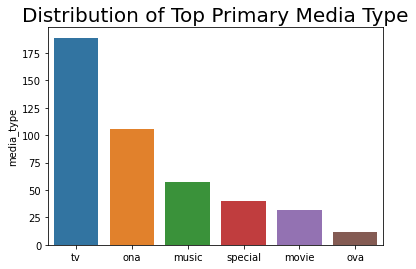

In [ ]:
# Bar graph for different types of anime formats
cols_for_bar = ['media_type']
top_studios = df_animes['media_type'].value_counts()[:15]
sns.barplot(x=top_studios.index, y=top_studios, ci=False)
plt.title('Distribution of Top Primary Media Type', size=20);

In [ ]:
df_tri = df_animes[df_animes.columns[12:83]]

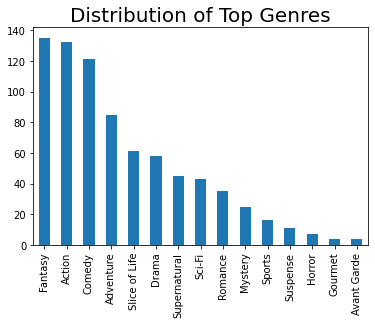

In [ ]:
# Top 10 genres by count
df_genres = df_tri[['Action', 'Adventure', 'Avant Garde', 'Award Winning',
                    'Boys Love', 'Comedy', 'Drama', 'Fantasy', 'Gourmet', 
                    'Horror', 'Mystery', 'Romance', 'Sci-Fi',
                    'Slice of Life', 'Sports', 'Supernatural', 'Suspense', 
                    'Ecchi', 'Hentai']] # might wanna remove these two
top_genres = df_genres.sum(axis=0).sort_values(ascending=False).head(15).plot.bar()
plt.title('Distribution of Top Genres', size=20);

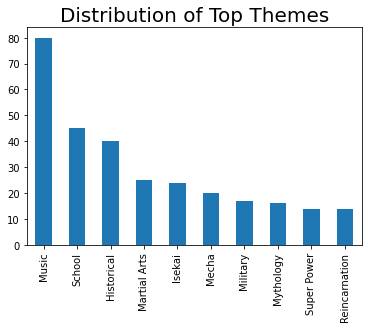

In [ ]:
# Top 10 themes by count
df_themes = df_tri[['Adult Cast', 'Anthropomorphic', 'CGDCT', 'Childcare',
                    'Combat Sports', 'Delinquents', 
                    'Detective', 'Educational', 'Gag Humor', 'Gore', 'Harem',
                    'High Stakes Game', 'Historical', 'Idols (Female)',
                    'Idols (Male)', 'Isekai', 'Iyashikei',
                    'Magical Sex Shift', 'Mahou Shoujo', 'Martial Arts',
                    'Mecha', 'Military', 'Music', 'Mythology',
                    'Organized Crime', 'Otaku Culture', 'Parody', 
                    'Performing Arts', 'Pets', 'Psychological', 'Racing', 
                    'Reincarnation', 'Reverse Harem', 'Romantic Subtext', 
                    'Samurai', 'School', 'Showbiz', 'Space', 'Strategy Game',
                    'Super Power', 'Survival', 'Team Sports', 'Time Travel',
                    'Vampire', 'Video Game', 'Visual Arts', 'Workplace']]
df_themes.sum(axis=0).sort_values(ascending=False).head(10).plot.bar()
plt.title('Distribution of Top Themes', size=20);

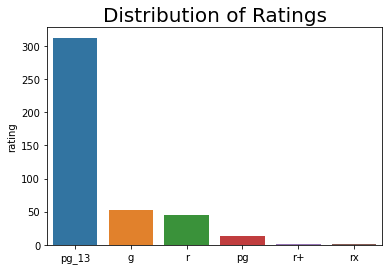

In [ ]:
top_studios = df_animes['rating'].value_counts()[:15]
sns.barplot(x=top_studios.index, y=top_studios, ci=False)
plt.title('Distribution of Ratings', size=20);

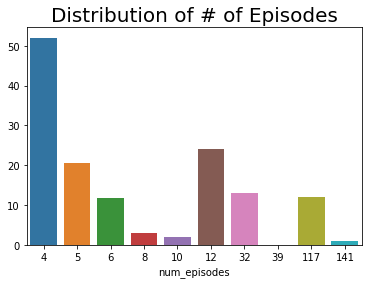

In [ ]:

top_eps = df_animes['num_episodes'].value_counts()[:15]
sns.barplot(y=top_studios.index, x=top_eps, ci=False)
plt.title('Distribution of # of Episodes', size=20);


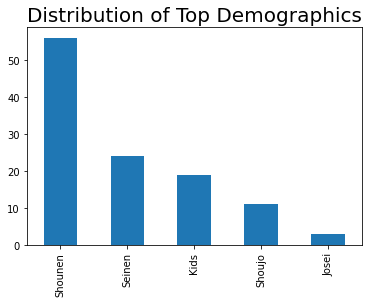

In [ ]:
# Top Demographics by count
df_demo = df_tri[['Josei', 'Kids', 'Seinen', 'Shoujo', 'Shounen']]
df_demo.sum(axis=0).sort_values(ascending=False).plot.bar()
plt.title('Distribution of Top Demographics', size=20);

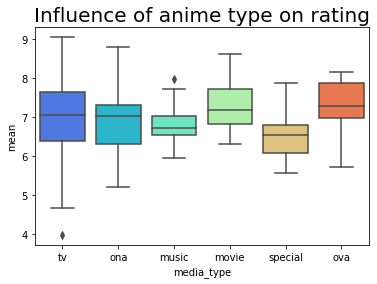

In [ ]:
# Box plot of variation of each anime based on rating

plt.title('Influence of anime type on rating', size=20)
sns.boxplot(x=df_animes['media_type'], y=df_animes['mean'], palette='rainbow');

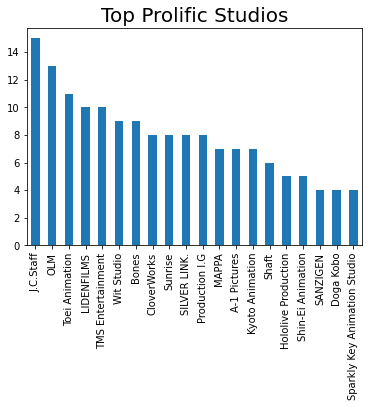

In [ ]:
# Top 20 most prolific studios
df_studios = df_animes[df_animes.columns[83:]]
df_studios.sum(axis=0).sort_values(ascending=False).head(20).plot.bar()
plt.title('Top Prolific Studios', size=20);

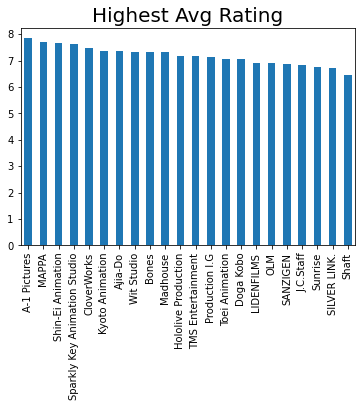

In [ ]:
# Studios with highest average rating based on those that produced 
# 4 or more anime in the past 4 seasons

df_hrstudios = df_studios.sum(axis=0)
df_hrstudios = df_hrstudios[df_hrstudios >= 4]

means = df_animes['mean']

df_animes[df_hrstudios.index].multiply(
    means, axis=0).sum(axis=0).divide(
        df_hrstudios).sort_values(ascending=False).plot.bar() 
plt.title('Highest Avg Rating', size=20);

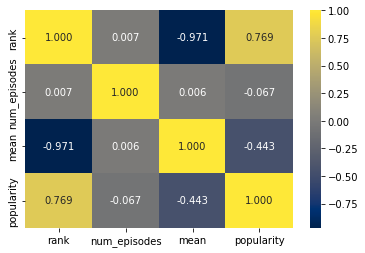

In [ ]:
# Heat map of correlation of columns
num_cols = [ 'rank', 'num_episodes', 'mean', 'popularity']
sns.heatmap(data=df_animes[num_cols].corr(), annot=True, fmt='0.3f', cmap='cividis');

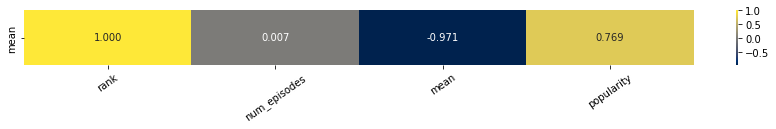

In [ ]:
# Secondary heat map of means
df_piv = pd.DataFrame({'mean': df_animes[num_cols].corr().iloc[0]}, index=df_animes[num_cols].corr().iloc[0].index)
rating_corr = df_animes[num_cols].corr().iloc[0]
plt.figure(figsize=(15,1))
df_piv = pd.DataFrame({cname: rating_corr[rating_corr.index==cname].iloc[0] for cname in rating_corr.index},
                      index=['mean'])

sns.heatmap(df_piv, annot=True, fmt='0.3f', cmap='cividis');
plt.xticks(rotation=35);

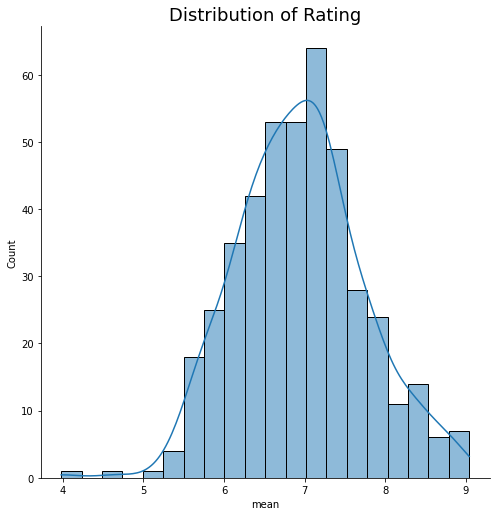

In [ ]:
# Normal bar graph distribution of ratings
sns.displot(df_animes['mean'], height=7,kde=True)
plt.title("Distribution of Rating", size=18);

In [ ]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df_animes, title='Anime', html={'style':{'full_width':True}})

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Extra Part: Scratch Work

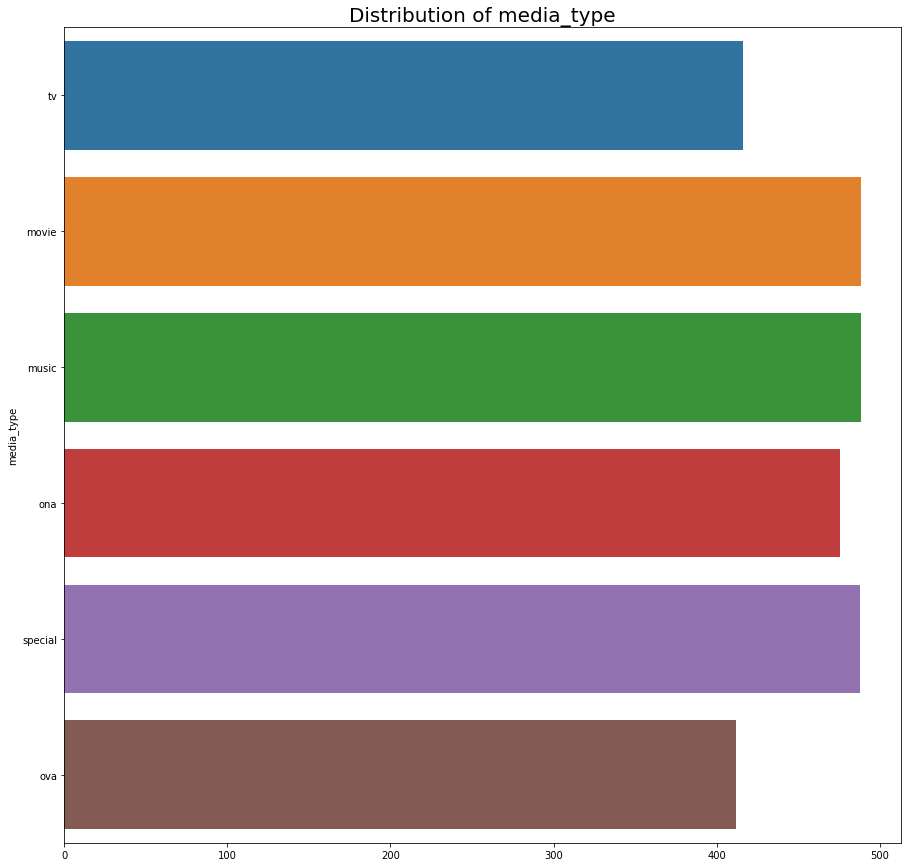

In [ ]:
cols_for_bar = ['media_type']
for col in cols_for_bar:
    plt.figure(figsize=(15,15))
    sns.barplot(y=df_animes[col], x=df_animes[col].index, ci=None)
    plt.title('Distribution of {}'.format(col), size=20)
    plt.show()

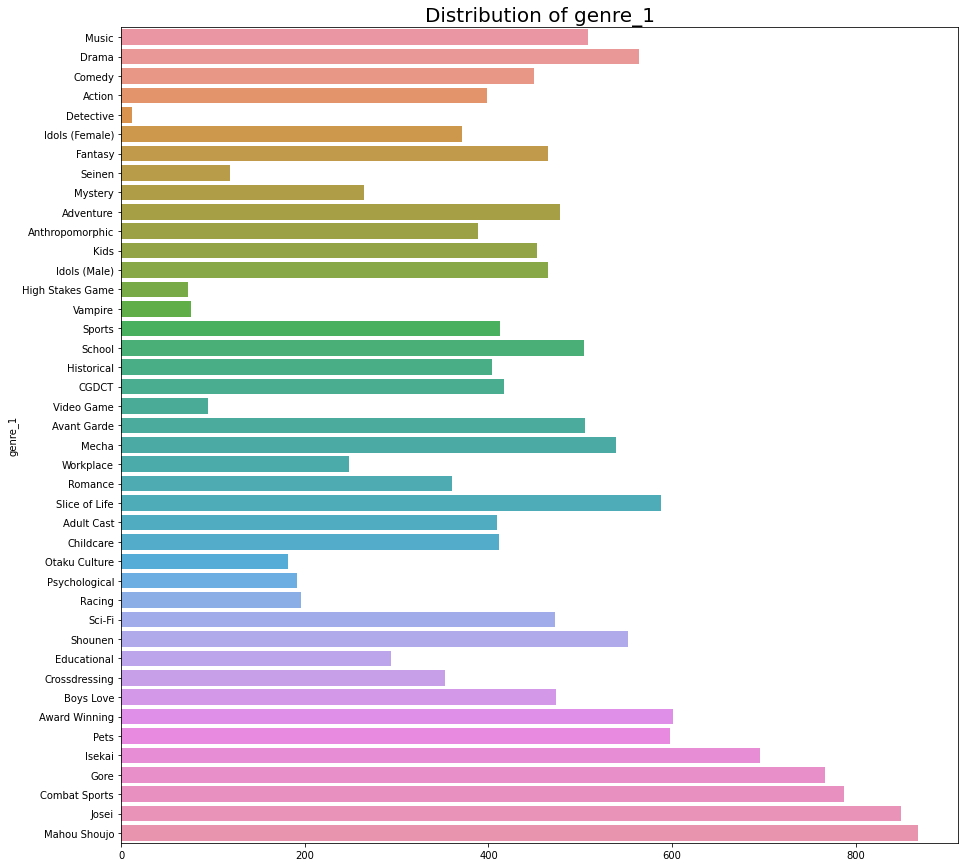

In [ ]:
cols_for_bar = ['genre_1']
for col in cols_for_bar:
    plt.figure(figsize=(15,15))
    sns.barplot(y=df_animes[col], x=df_animes[col].index, ci=None)
    plt.title('Distribution of {}'.format(col), size=20)
    plt.show()

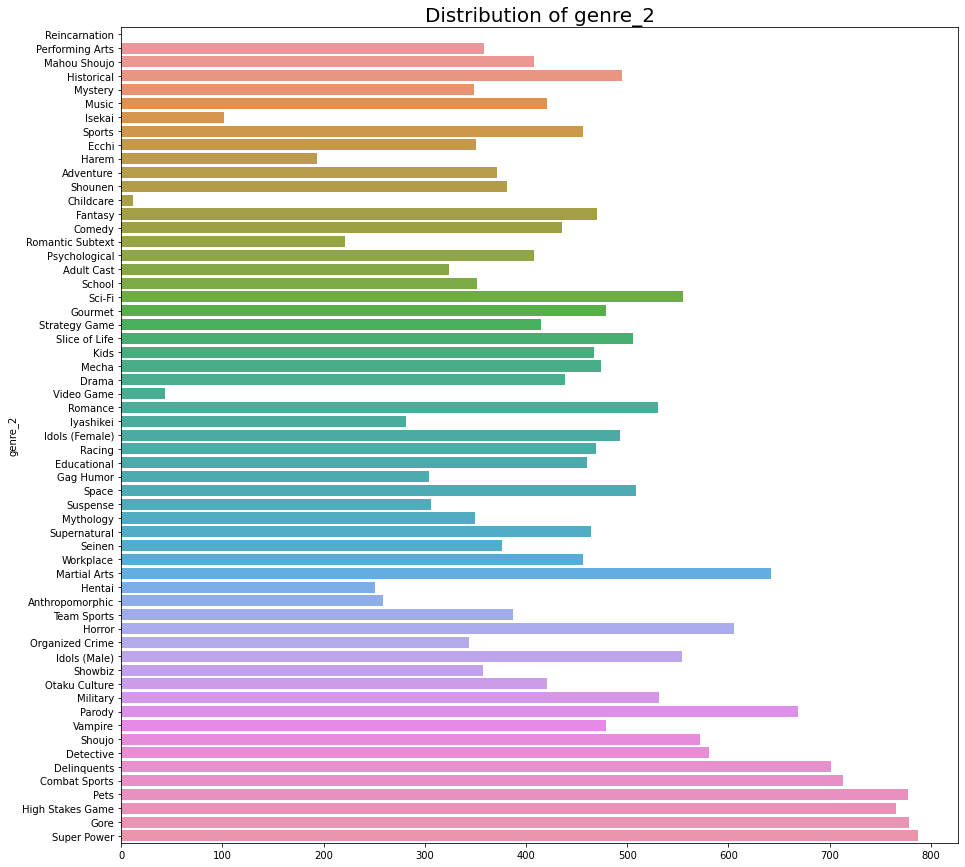

In [ ]:
cols_for_bar = ['genre_2']
for col in cols_for_bar:
    plt.figure(figsize=(15,15))
    sns.barplot(y=df_animes[col], x=df_animes[col].index, ci=None)
    plt.title('Distribution of {}'.format(col), size=20)
    plt.show()

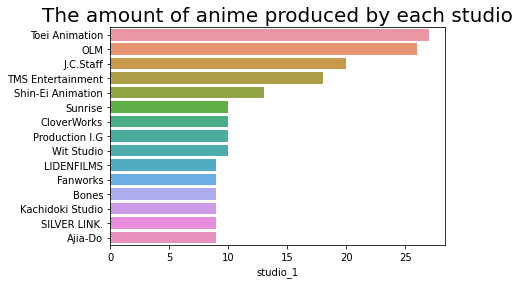

In [ ]:
top_studios = df_animes['studio_1'].value_counts()[:15]
sns.barplot(y=top_studios.index, x=top_studios, ci=False)
plt.title('The amount of anime produced by each studio', size=20);

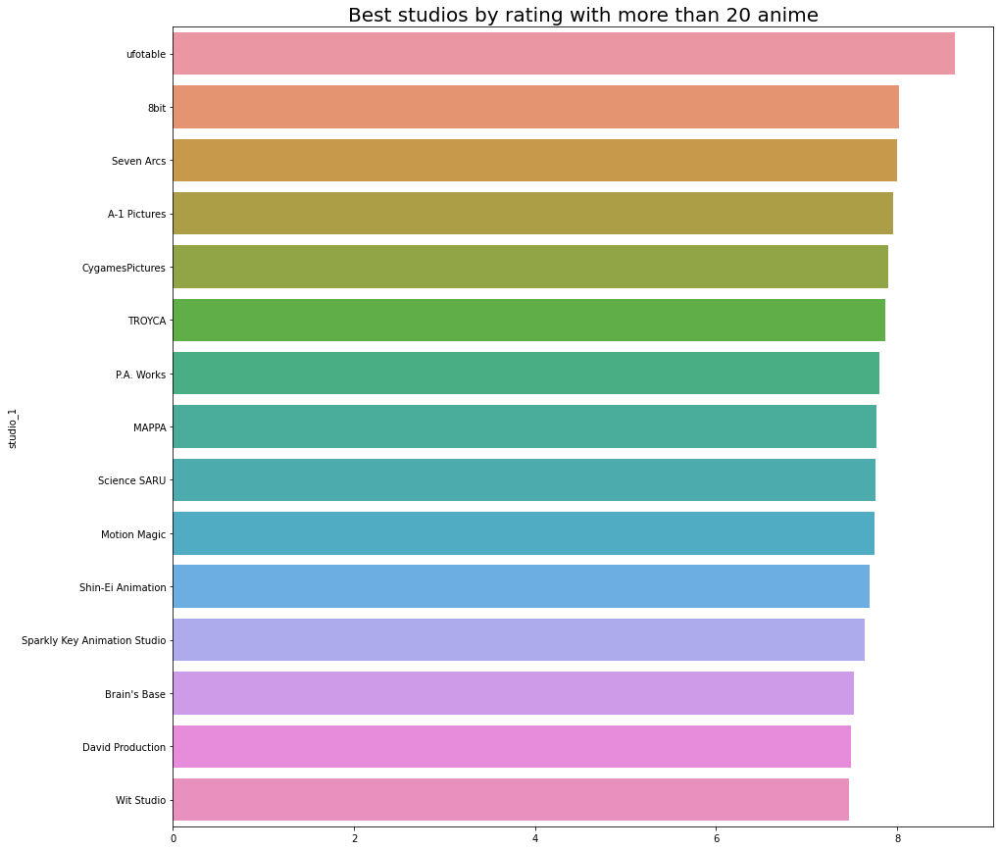

In [ ]:
studios_more_20 = list(df_animes['studio_1'].value_counts().index[:111])

top_studios_rtg = df_animes[df_animes['studio_1'].isin(studios_more_20)].groupby('studio_1')[ 'mean'].mean().sort_values(ascending=False)[:15]
plt.figure(figsize=(15,15))
sns.barplot(y=top_studios_rtg.index, x=top_studios_rtg.values).set_title('Best studios by rating with more than 20 anime', size=20);